In [18]:
import numpy as np
import pandas as pd
# import scanpy.api as sc
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import matplotlib as mpl
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

In [19]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis', transparent=False, 
                              frameon=False, fontsize=20)  # low dpi (dots per inch) yields small inline figures

import matplotlib as mpl
# 2 lines below solved the facecolor problem.
# mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
sc.settings.autosave = True
sc.logging.print_versions()

version = '210711_merged_thymoma_MG21.22.23.03_myeloid'

# file_mat = 'F1314_200323_222536_summary/10425963-2_3DE_genematrix.csv'


results_file_myeloid_all = './scanpy/{}/merge_myeloid_all.h5ad'.format(version)
results_file_myeloid = './scanpy/{}/merge_myeloid.h5ad'.format(version)
# results_file_abTcell = './scanpy/{}/merge_abTcell.h5ad'.format(version)
results_file_myeloid_minor_cluster = './scanpy/{}/merge_myeloid_minor_cluster.h5ad'.format(version)
results_file_cg_myeloid_minor_cluster = './scanpy/{}/merge_cg_myeloid_minor_cluster.h5ad'.format(version)

results_file_master = './scanpy/210711_merged_thymoma_MG21.22.23.03/merge.h5ad'
results_raw_file_master = './scanpy/210711_merged_thymoma_MG21.22.23.03/merge.raw.h5ad'

# for cellphonedb
raw_matrix = './scanpy/{}/merge.raw.tsv'.format(version)

sc.settings.figdir = './scanpy/{}/graph'.format(version)
sc.settings.cachedir = './scanpy/{}/cache'.format(version)
# %config InlineBackend.figure_format = 'retina'

-----
anndata     0.7.6
scanpy      1.7.2
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.6
attr                20.3.0
backcall            0.2.0
cffi                1.14.5
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.2
get_version         2.1
google              NA
h5py                2.10.0
idna                2.10
igraph              0.9.1
ipykernel           5.3.4
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.17.2
jinja2              2.11.3
joblib              1.0.1
jsonschema          3.2.0
kiwisolver          1.3.1
legacy_api_wrap     1.2
leidenalg           0.8.4
llvmlite            0.34.0
markupsafe          1.1.1
matplotlib          3.4.1
mpl_toolkits        NA
natsort             7.1.1
nbformat            5.1.3
numba               0.51.0
numexpr             2.7.3
numpy               1.20.2
packaging           20.9
pandas              1.2.4
pars

In [3]:
adata_raw = sc.read(results_raw_file_master)
adata = sc.read(results_file_master)

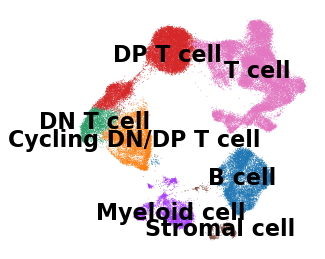

In [4]:
sc.pl.umap(adata, color='major_cluster', legend_loc='on data', title='', frameon=False, save='major_cluster_all')

In [5]:
adata

AnnData object with n_obs × n_vars = 65935 × 1506
    obs: 'sample', 'sample_type', 'site', 'fraction', 'n_genes', 'individual', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden', 'leiden_R', 'major_cluster'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'individual_colors', 'leiden', 'leiden_R_colors', 'leiden_colors', 'major_cluster_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_colors', 'site_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [6]:
adata_cp = adata_raw[adata[adata.obs['major_cluster'] == 'Myeloid cell'].obs.index].copy()

    
adata = adata_cp.copy()
adata_cp = None

In [7]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
adata.raw = sc.pp.log1p(adata, copy=True)

normalizing by total count per cell
    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [8]:
adata

AnnData object with n_obs × n_vars = 4544 × 36601
    obs: 'sample', 'sample_type', 'site', 'fraction', 'n_genes', 'individual', 'n_counts'

In [9]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

Text(0.5, 1.0, 'Run')

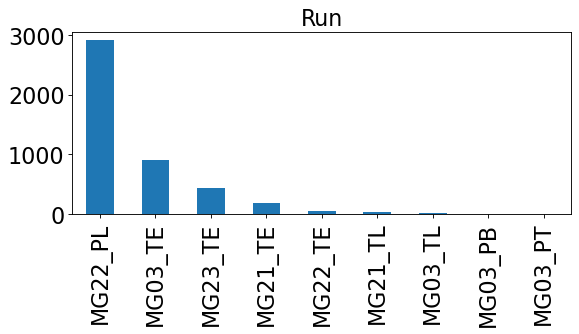

In [10]:
plt.figure(figsize=(8,3))
pd.Series(adata.obs['sample']).value_counts().plot(kind='bar')
plt.grid(None)
plt.title('Run')
# plt.savefig(str(sc.settings.figdir) + '/run.pdf', bbox_inches='tight')

In [11]:
# adata = adata[adata.obs['sample'].isin(['MG03_TE', 'MG21_TE', 'MG22_TE'])]

extracting highly variable genes
    finished (0:00:00)


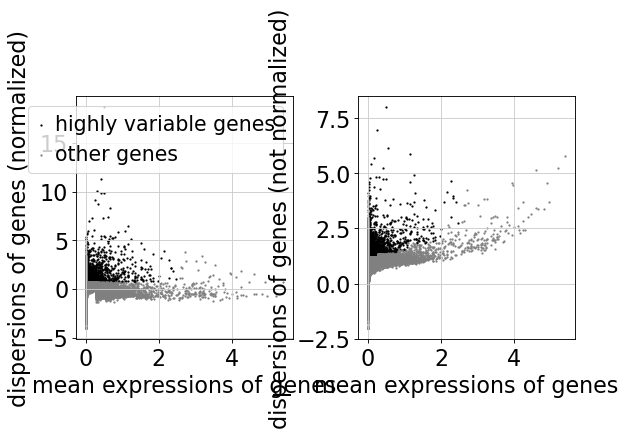

[2795, 36601]


In [12]:
filter_result = sc.pp.filter_genes_dispersion(
    adata.X, min_mean=0.0125, max_mean=2.5, min_disp=0.7)
sc.pl.filter_genes_dispersion(filter_result)
print([sum([i[0] for i in filter_result]),len(filter_result)])

/home/yyasumizu/anaconda3/envs/scanpy1.7.2/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:375: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:02)


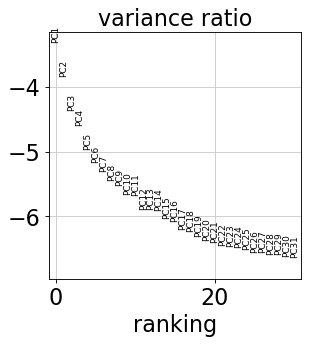

In [13]:
adata = adata[:, filter_result.gene_subset]
sc.pp.log1p(adata)
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata)
adata.obsm['X_pca'] *= -1  # multiply by -1 to match Seurat
sc.pl.pca_variance_ratio(adata, log=True)

In [14]:
sc.external.pp.bbknn(adata, batch_key='sample')
sc.tl.umap(adata, spread=2)
sc.tl.leiden(adata, resolution=4)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)
running Leiden clustering
    finished: found 46 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


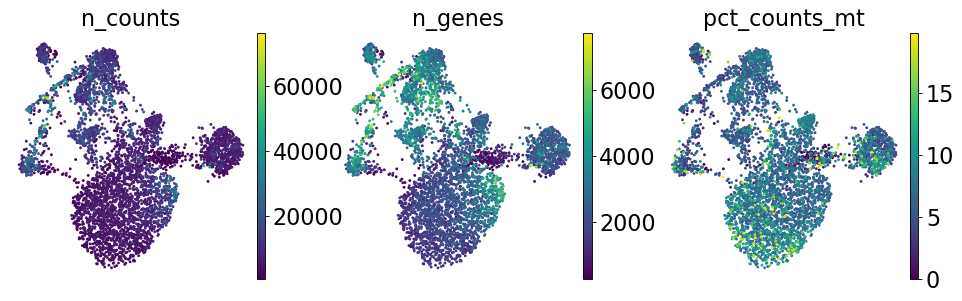

In [15]:
sc.pl.umap(adata, color=['n_counts', 'n_genes', 'pct_counts_mt'], save='qc')

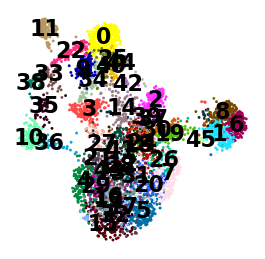

In [16]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='leiden.pdf')

In [17]:
sc.tl.leiden(adata, resolution=0.6, restrict_to=('leiden', ['14']))

running Leiden clustering
    finished: found 50 clusters and added
    'leiden_R', the cluster labels (adata.obs, categorical) (0:00:00)


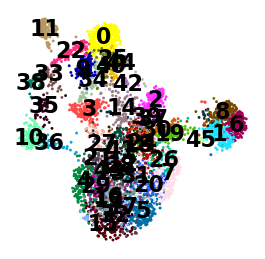

In [18]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='leiden.pdf')

In [19]:
sc.tl.leiden(adata, resolution=4)

running Leiden clustering
    finished: found 46 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


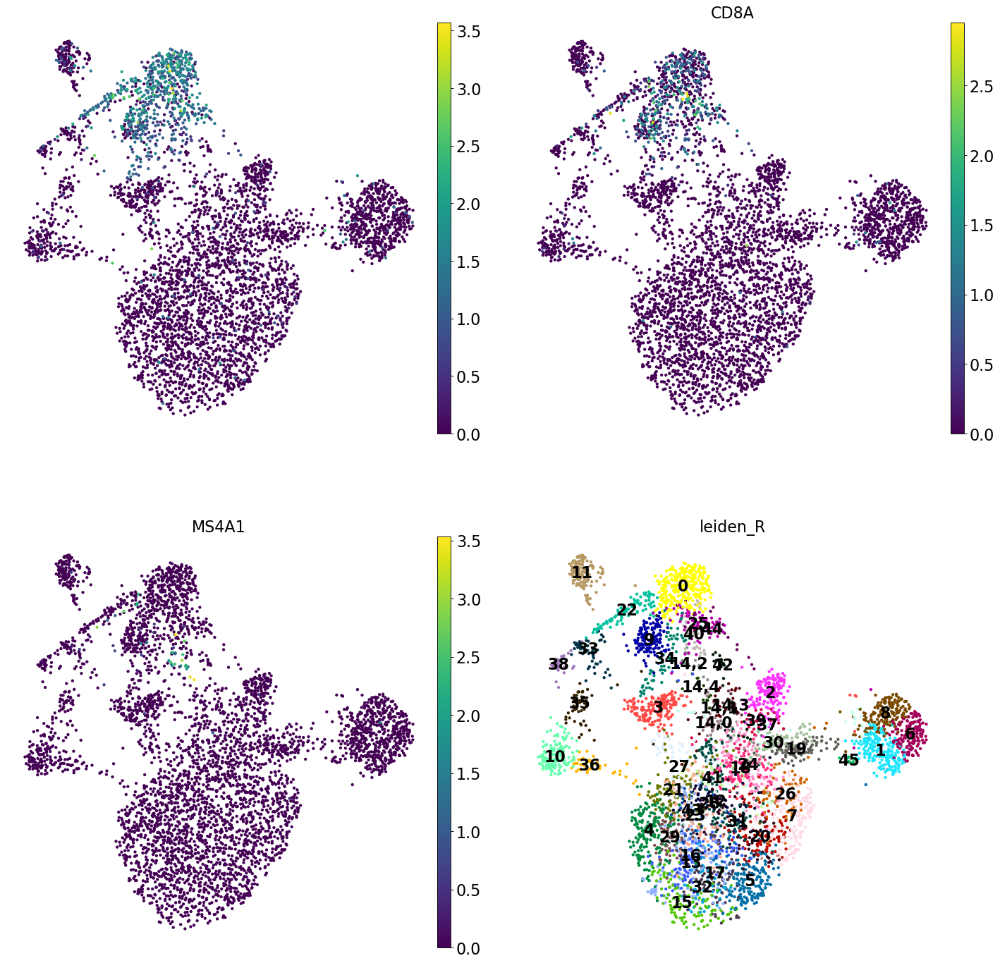

In [20]:
with plt.rc_context({"figure.figsize": (10, 10)}):
    sc.pl.umap(adata, color=['CD3E', 'CD8A', 'MS4A1', 'leiden_R'], legend_loc='on data', title='',
               frameon=False, save='leiden.large.pdf', s=60, ncols=2)

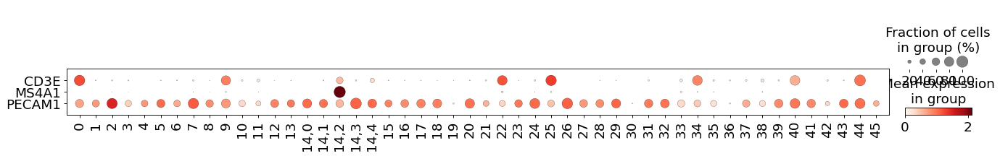

In [21]:
sc.pl.dotplot(adata, var_names=['CD3E', 'MS4A1', 'PECAM1'], groupby='leiden_R', swap_axes=True)

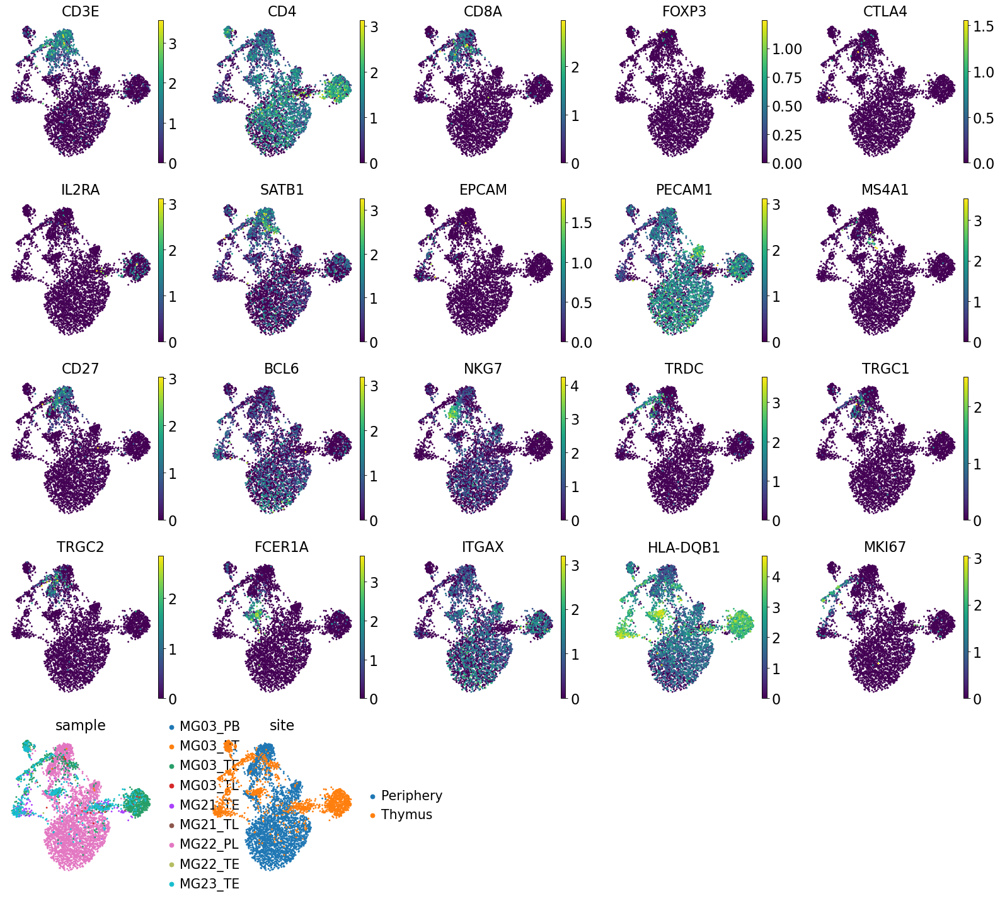

In [22]:
# ITGAX : CD11C
# CD27 : memory B
sc.pl.umap(adata, color=['CD3E', 'CD4', 'CD8A', 'FOXP3', 'CTLA4', 'IL2RA', 'SATB1', 'EPCAM', 'PECAM1', 'MS4A1', 'CD27', 'BCL6',
                         'NKG7', 'TRDC', 'TRGC1', 'TRGC2', 'FCER1A', 'ITGAX', 'HLA-DQB1', 'MKI67', 'sample', 'site'],
          save='panel', ncols=5)

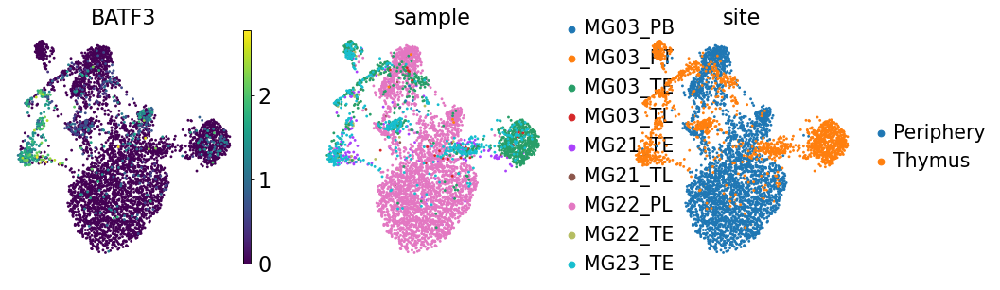

In [23]:
# ITGAX : CD11C
# CD27 : memory B
sc.pl.umap(adata, color=['BATF3', 'sample', 'site'],
          save='panel_Myelo', ncols=5)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:20)


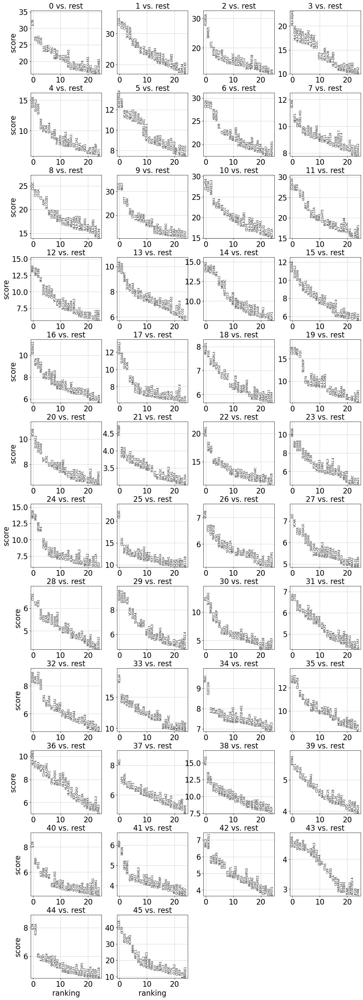

In [24]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test_overestim_var')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [25]:
print('\n'.join(list(adata.uns['rank_genes_groups']['names']['10'])[:10]))

C1orf54
CLEC9A
DNASE1L3
SNX3
CPVL
WDFY4
IRF8
RGCC
IDO1
CLNK


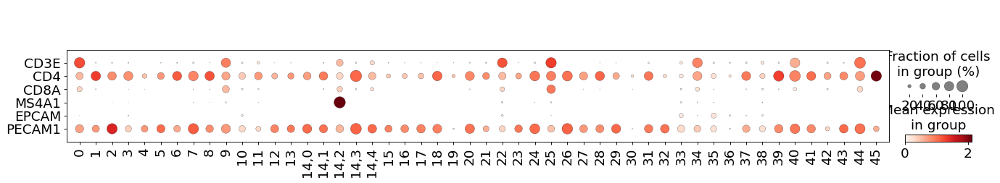

In [26]:
sc.pl.dotplot(adata, var_names=['CD3E', 'CD4', 'CD8A', 'MS4A1', 'EPCAM', 'PECAM1'], groupby='leiden_R', swap_axes=True)

In [27]:
c = list(adata.obs['leiden_R'].cat.categories)

df_clusters = pd.DataFrame(c, columns = ['cluster'])
df_clusters.index = df_clusters['cluster'].copy()
df_clusters.index.name = 'leiden_R'
df_clusters['cluster'] = 'Myeloid cell'
df_clusters.index = df_clusters.index.astype(str)
df_clusters.loc[['0', '9', '14,2', '22', '25', '34', '40', '44'], 'cluster'] = 'Doublet'
df_clusters

,cluster
leiden_R,
0,Doublet
1,Myeloid cell
2,Myeloid cell
3,Myeloid cell
4,Myeloid cell
5,Myeloid cell
6,Myeloid cell
7,Myeloid cell
8,Myeloid cell


In [28]:
# df_clusters =  pd.read_csv('210407_clusters/Tcell_clusters.csv', index_col=0)
# df_clusters.index = df_clusters.index.astype(str)
adata.obs['Myeloid_cluster'] = [df_clusters.loc[x, 'cluster'] for x in adata.obs['leiden_R']]
df_clusters

,cluster
leiden_R,
0,Doublet
1,Myeloid cell
2,Myeloid cell
3,Myeloid cell
4,Myeloid cell
5,Myeloid cell
6,Myeloid cell
7,Myeloid cell
8,Myeloid cell


... storing 'Myeloid_cluster' as categorical


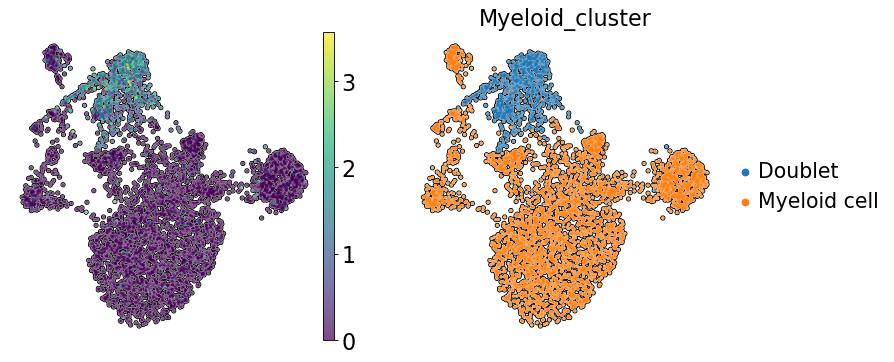

In [29]:
with plt.rc_context({"figure.figsize": (5,5)}):
    sc.pl.umap(adata, color=['CD3E', 'Myeloid_cluster'], add_outline=True,
           title='', frameon=False, save='Myeloid_cluster.pdf', s=30)

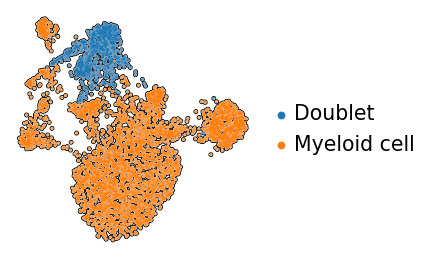

In [30]:
sc.pl.umap(adata, color='Myeloid_cluster', title='', add_outline=True, 
           frameon=False, save='myeloid_cluster_out.pdf')

In [32]:
adata.write(results_file_myeloid_all)

## remove droplet

In [39]:
adata = sc.read(results_file_myeloid_all)

In [40]:
adata_raw = sc.read(results_raw_file_master)

adata_cp = adata_raw[adata[adata.obs['Myeloid_cluster']!='Doublet'].obs.index].copy()
    
adata = adata_cp.copy()
adata_cp = None

adata = adata[adata.obs['sample'] != 'MG03_PT'].copy()

sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
adata.raw = sc.pp.log1p(adata, copy=True)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [41]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

extracting highly variable genes
    finished (0:00:00)


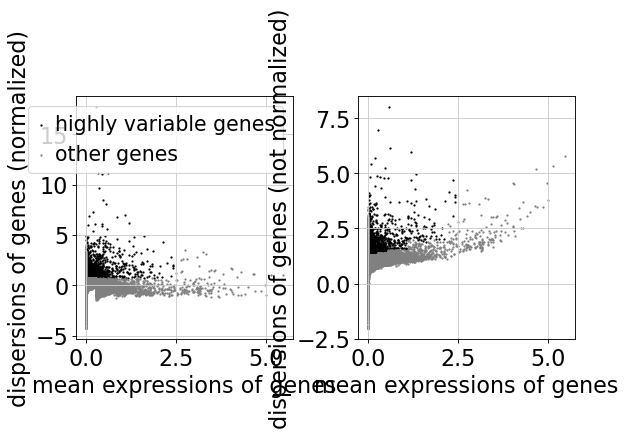

[2725, 36601]


In [42]:
filter_result = sc.pp.filter_genes_dispersion(
    adata.X, min_mean=0.0125, max_mean=2.5, min_disp=0.7)
sc.pl.filter_genes_dispersion(filter_result)
print([sum([i[0] for i in filter_result]),len(filter_result)])

/home/yyasumizu/anaconda3/envs/scanpy1.7.2/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:375: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:02)


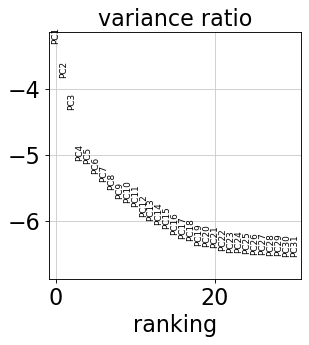

In [43]:
adata = adata[:, filter_result.gene_subset]
sc.pp.log1p(adata)
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata)
adata.obsm['X_pca'] *= -1  # multiply by -1 to match Seurat
sc.pl.pca_variance_ratio(adata, log=True)

In [44]:
sc.external.pp.bbknn(adata, batch_key='sample')
sc.tl.umap(adata, spread=1)
sc.tl.leiden(adata, resolution=1)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [45]:
adata.obs['sample'].value_counts()

MG22_PL    2366
MG03_TE     742
MG23_TE     415
MG21_TE     174
MG22_TE      50
MG03_TL      19
MG21_TL      19
Name: sample, dtype: int64

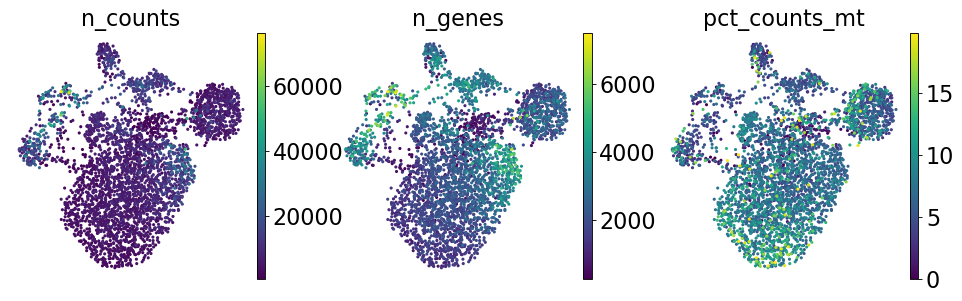

In [46]:
sc.pl.umap(adata, color=['n_counts', 'n_genes', 'pct_counts_mt'], save='qc')

In [47]:
sc.tl.leiden(adata, resolution=.8)

running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


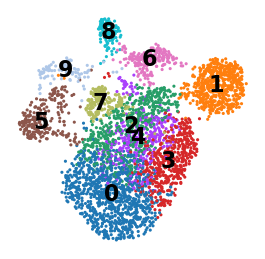

In [48]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='Myeloid_leiden.pdf')

In [8]:
adata.to_df().corr()

,LINC01409,HES4,ISG15,TNFRSF4,CDK11B,PRKCZ,TPRG1L,ACOT7,PLEKHG5,ZBTB48,...,SPRY3,RPS4Y1,LINC00278,PRKY,USP9Y,DDX3Y,TTTY14,MT-ND6,AC240274.1,AC007325.4
LINC01409,1.000000,-0.006015,-0.012826,-0.012841,0.034004,0.027946,-0.004916,0.005414,-0.020289,0.004114,...,-0.017065,-0.029624,-0.016187,0.000459,-0.008710,0.015885,0.016474,0.042058,0.001069,0.016430
HES4,-0.006015,1.000000,0.174709,-0.015493,-0.011951,0.028067,-0.027184,0.057321,-0.007068,-0.012903,...,0.004916,0.098494,0.039754,0.046450,-0.005952,0.069116,0.048775,-0.016969,0.012170,0.024386
ISG15,-0.012826,0.174709,1.000000,0.031438,0.006492,-0.000831,-0.014163,0.024205,0.016941,0.037526,...,-0.000849,0.016128,-0.004836,-0.000933,-0.016474,0.009521,-0.005574,-0.001413,0.014584,-0.006790
TNFRSF4,-0.012841,-0.015493,0.031438,1.000000,0.041064,-0.001238,0.019524,0.039270,0.075287,0.000658,...,0.006530,0.057564,0.021903,0.023432,0.019818,0.075701,0.040932,0.023543,0.011903,-0.006110
CDK11B,0.034004,-0.011951,0.006492,0.041064,1.000000,0.005645,-0.025978,0.019744,-0.006243,-0.004358,...,0.005827,-0.023682,-0.019127,-0.015796,-0.006196,-0.013994,-0.021589,0.032324,0.015382,0.003938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DDX3Y,0.015885,0.069116,0.009521,0.075701,-0.013994,-0.002460,0.038129,0.034600,0.092025,-0.024245,...,-0.021844,0.405156,0.174037,0.191892,0.243124,1.000000,0.132737,0.016183,0.020841,0.021037
TTTY14,0.016474,0.048775,-0.005574,0.040932,-0.021589,0.022105,0.018512,0.032305,0.058531,-0.021272,...,-0.011342,0.198702,0.075856,0.009420,0.086970,0.132737,1.000000,-0.002955,-0.017803,-0.012682
MT-ND6,0.042058,-0.016969,-0.001413,0.023543,0.032324,-0.014951,-0.001214,0.053636,0.008139,0.010624,...,0.011630,-0.013860,0.016479,-0.003989,0.020886,0.016183,-0.002955,1.000000,-0.004005,0.004707
AC240274.1,0.001069,0.012170,0.014584,0.011903,0.015382,-0.001696,0.005292,-0.011386,0.031892,0.017751,...,-0.013454,0.019348,-0.017148,-0.014111,0.027056,0.020841,-0.017803,-0.004005,1.000000,0.011341


In [9]:
df_corr = adata.raw.to_adata().to_df().corr()

In [17]:
df_corr = adata.raw.to_adata().to_df().corr()
df_corr['ZBTB48'].sort_values(ascending=False)

ZBTB48      1.000000
TRMT61A     0.066692
AZI2        0.065199
IDO1        0.064668
DNASE1L3    0.060572
              ...   
C1QA       -0.051560
MAF        -0.051957
A2M        -0.054787
GPR34      -0.057121
MS4A7      -0.057651
Name: ZBTB48, Length: 2725, dtype: float64

In [13]:
adata.raw.to_adata()

AnnData object with n_obs × n_vars = 3785 × 36601
    obs: 'sample', 'sample_type', 'site', 'fraction', 'n_genes', 'individual', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Myelo_cluster', 'umap_density_site'
    uns: 'Myelo_cluster_colors', 'Myelo_cluster_sizes', 'dendrogram_Myelo_cluster', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'sample_colors', 'site_colors', 'umap', 'umap_density_site_params'
    obsm: 'X_pca', 'X_umap'

In [14]:
adata

AnnData object with n_obs × n_vars = 3785 × 2725
    obs: 'sample', 'sample_type', 'site', 'fraction', 'n_genes', 'individual', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Myelo_cluster', 'umap_density_site'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'Myelo_cluster_colors', 'Myelo_cluster_sizes', 'dendrogram_Myelo_cluster', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'sample_colors', 'site_colors', 'umap', 'umap_density_site_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

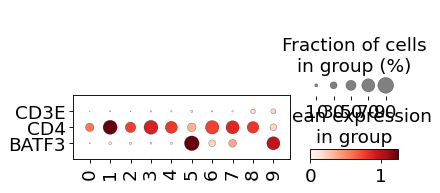

In [49]:
sc.pl.dotplot(adata, var_names=['CD3E', 'CD4', 'BATF3'], 
              groupby='leiden', swap_axes=True)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


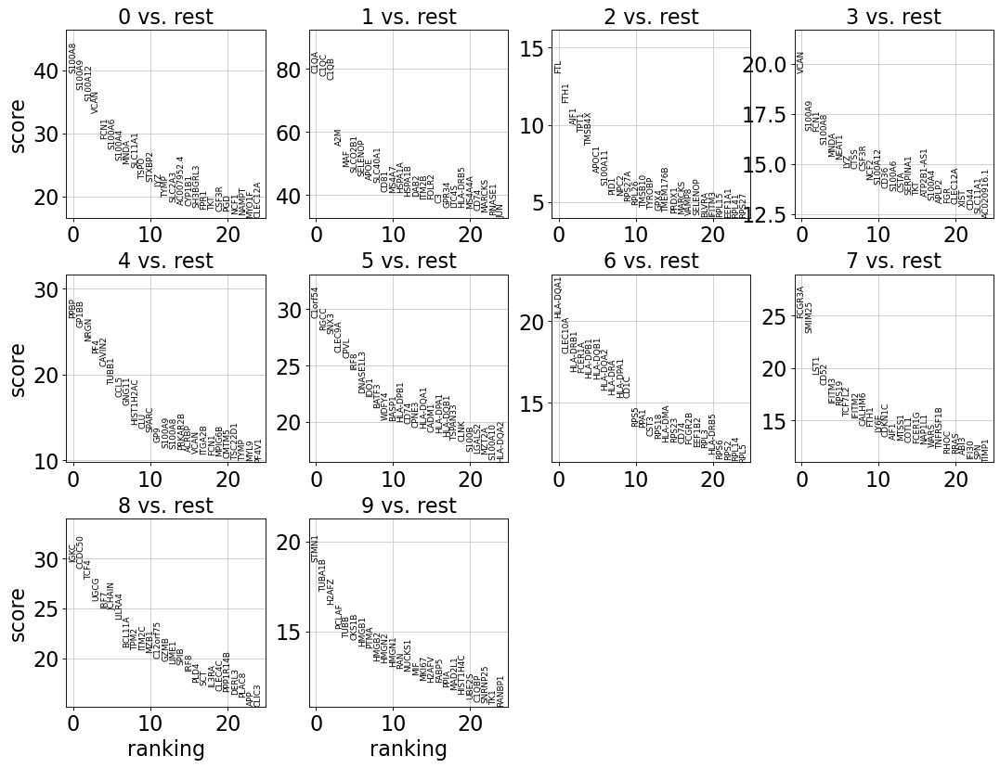

In [50]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test_overestim_var')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

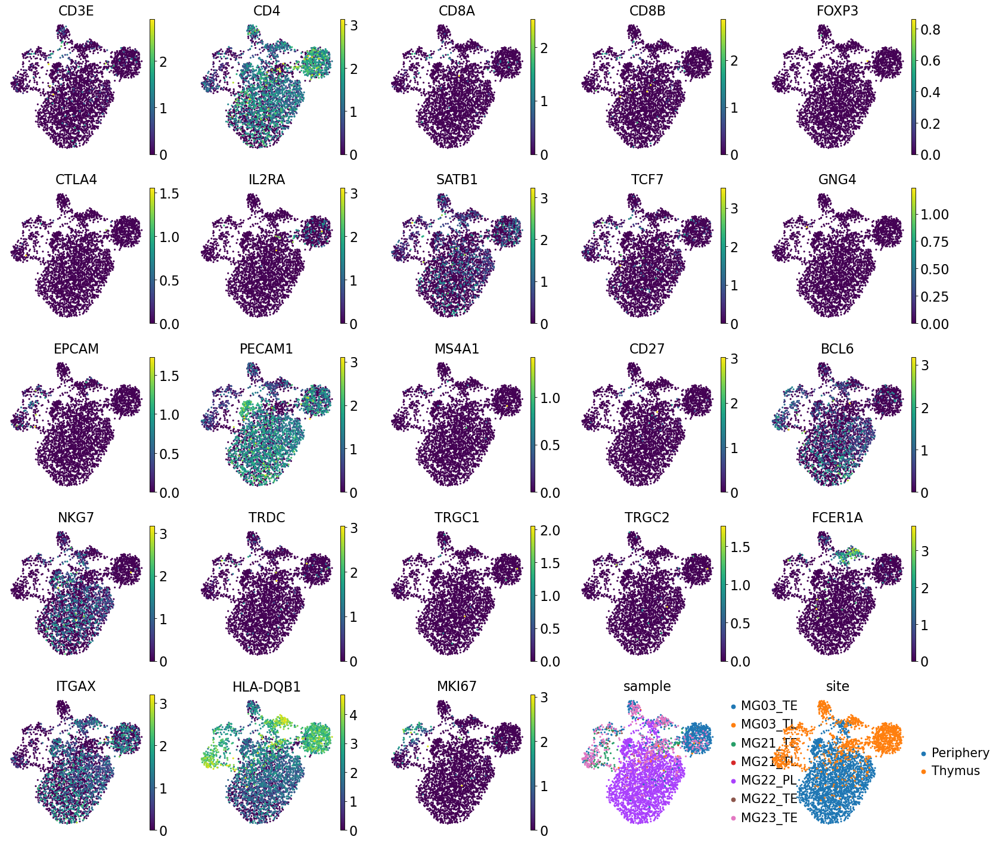

In [51]:
# ITGAX : CD11C
# CD27 : memory B
sc.pl.umap(adata, color=['CD3E', 'CD4', 'CD8A', 'CD8B', 'FOXP3', 'CTLA4', 'IL2RA', 'SATB1', 'TCF7', 'GNG4',
                         'EPCAM', 'PECAM1', 'MS4A1', 'CD27', 'BCL6',
                         'NKG7', 'TRDC', 'TRGC1', 'TRGC2', 'FCER1A', 'ITGAX', 'HLA-DQB1',
                         'MKI67', 'sample', 'site'],
          save='Myeloid_panel', ncols=5)

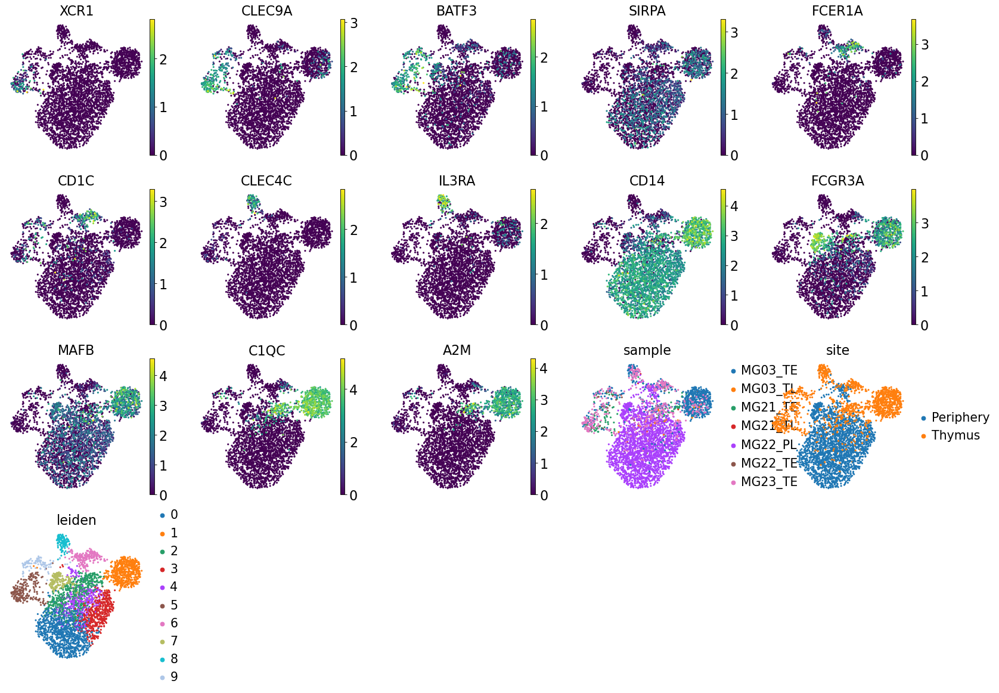

In [52]:
# XCR1, CLEC9A, BATF3 : cDC1
# SIRPA, FCER1A,CD1C : cDC2
# CLEC4C, IL3RA : pDC
# CD14 : CD14+ mono
# FCGR3A(CD16) : CD16+ mono
# MAFB, C1QC : Mac
list_markers = ['XCR1', 'CLEC9A', 'BATF3', 
                'SIRPA', 'FCER1A', 'CD1C',
                'CLEC4C', 'IL3RA',
                'CD14', 'FCGR3A', 
                'MAFB', 'C1QC', 'A2M']
sc.pl.umap(adata, color=list_markers+['sample', 'site', 'leiden'],
          save='Myeloid_panel_Myeloid', ncols=5)

<AxesSubplot:xlabel='leiden', ylabel='sample'>

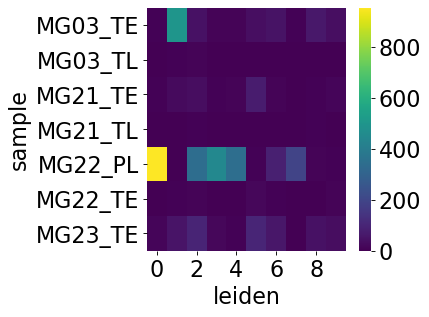

In [53]:
sns.heatmap(pd.crosstab(adata.obs['sample'], adata.obs['leiden']), cmap='viridis')

<AxesSubplot:xlabel='leiden', ylabel='site'>

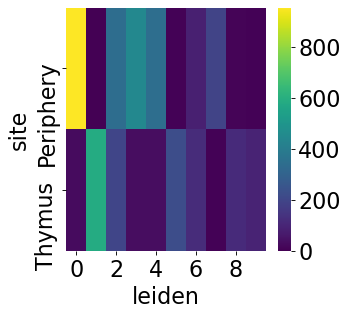

In [54]:
sns.heatmap(pd.crosstab(adata.obs['site'], adata.obs['leiden']), cmap='viridis')

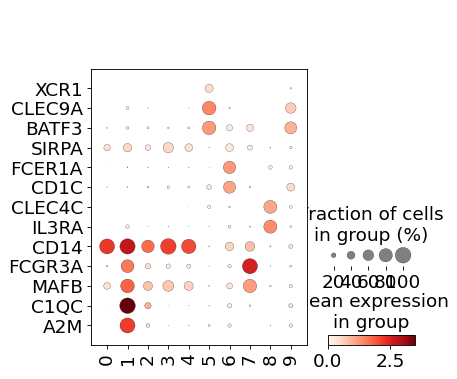

In [58]:
sc.pl.dotplot(adata, var_names=list_markers, 
              groupby='leiden', swap_axes=True)

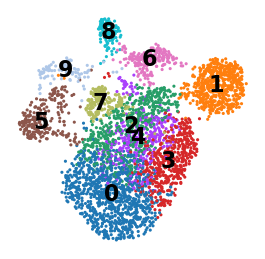

In [59]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='Myeloid_leiden.pdf')

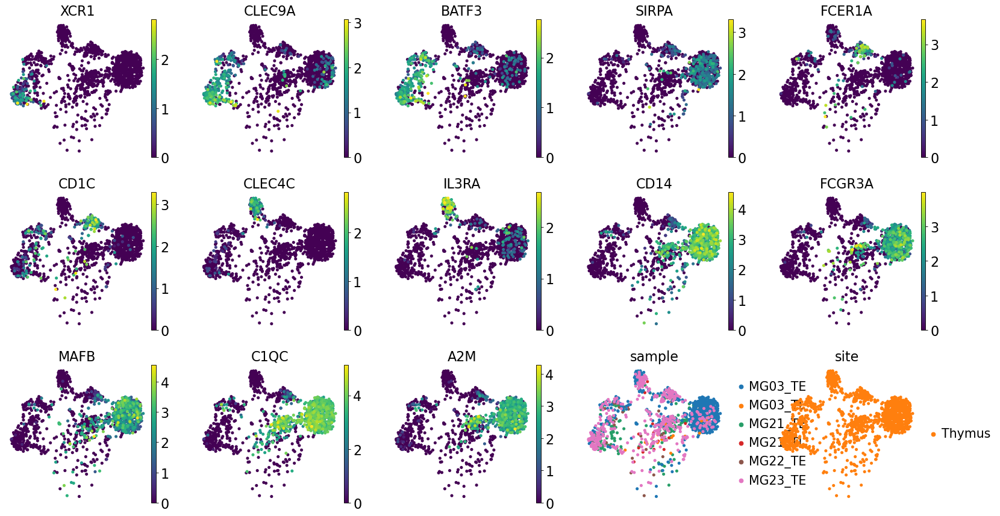

In [60]:
# ITGAX : CD11C
# CD27 : memory B
sc.pl.umap(adata[adata.obs['site']=='Thymus'], 
           color=list_markers+['sample', 'site'],
          save='Myelo_panel_Myelo_thymus', ncols=5)

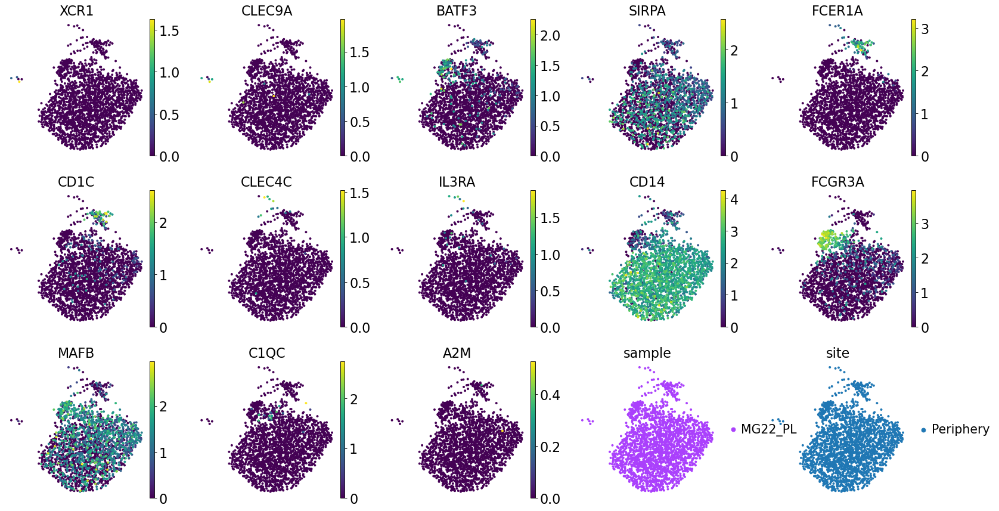

In [61]:
# ITGAX : CD11C
# CD27 : memory B
sc.pl.umap(adata[adata.obs['site']=='Periphery'], 
           color=list_markers+['sample', 'site'],
          save='Myelo_panel_Myelo_peri', ncols=5)

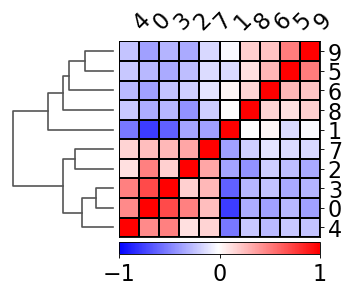

In [63]:
ax = sc.pl.correlation_matrix(adata, 'leiden', figsize=(5,3.5))

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


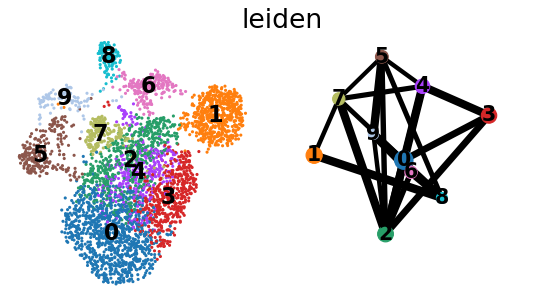

In [64]:
sc.tl.paga(adata, groups='leiden')
sc.pl.paga_compare(adata, threshold=0.5, basis='umap')

In [65]:
df_clusters =  pd.read_csv('210430_clusters/Myeloid_clusters.csv', index_col=0)
df_clusters.index = df_clusters.index.astype(str)
adata.obs['Myelo_cluster'] = [df_clusters.loc[x, 'cluster'] for x in adata.obs['leiden']]
df_clusters

,cluster
leiden,
0,Monocyte (CD14)
1,Macrophage
2,Monocyte (CD14)
3,Monocyte (CD14)
4,Monocyte (CD14)
5,cDC1
6,cDC2
7,Monocyte (CD16)
8,pDC


... storing 'Myelo_cluster' as categorical


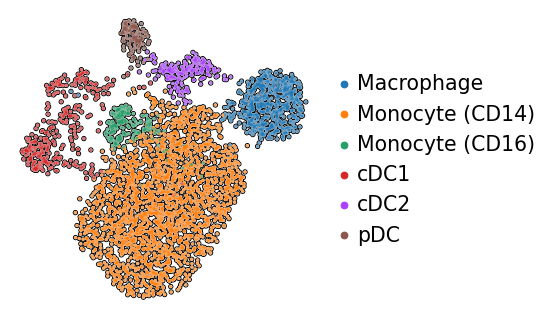

In [66]:
with plt.rc_context({"figure.figsize": (5,5)}):
    sc.pl.umap(adata, color='Myelo_cluster', add_outline=True,
           title='', frameon=False, save='Myelo_cluster.pdf')

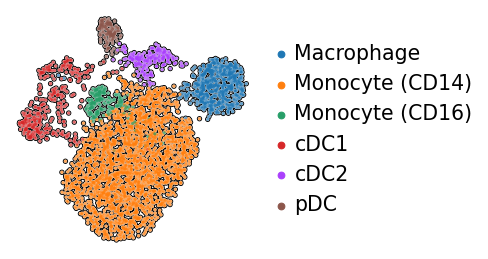

In [67]:
sc.pl.umap(adata, color='Myelo_cluster', title='', add_outline=True, 
           frameon=False, save='Myelo_cluster_out.pdf')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


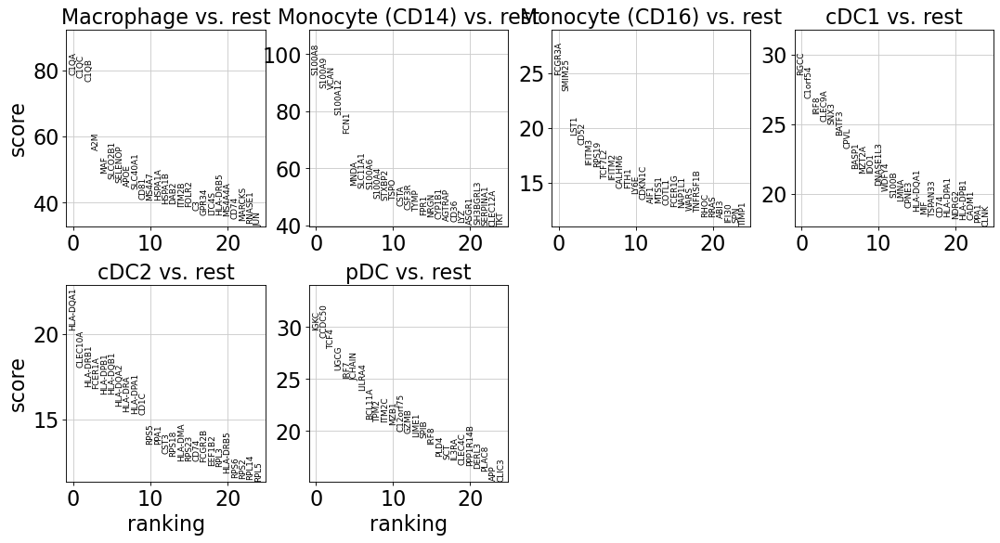

In [68]:
sc.tl.rank_genes_groups(adata, 'Myelo_cluster', method='t-test_overestim_var')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [69]:
print('\n'.join(list(adata.uns['rank_genes_groups']['names']['Macrophage'])[:100]))

C1QA
C1QC
C1QB
A2M
MAF
SLCO2B1
SELENOP
APOE
SLC40A1
CD81
MS4A7
HSPA1A
HSPA1B
DAB2
ITM2B
FOLR2
C3
GPR34
LTC4S
HLA-DRB5
MS4A4A
CD74
MARCKS
RNASE1
JUN
HLA-DRA
MRC1
CSF1R
IER3
HLA-DPA1
RGS1
HLA-DMA
DNAJB1
MSR1
LGMN
IGF1
ADAP2
CTSB
HLA-DPB1
HSP90AA1
HSPB1
MS4A6A
HLA-DQA1
RHOB
TMEM176B
NPC2
ZFP36L1
PLTP
CTSL
AXL
MGAT4A
PLXDC1
HLA-DQA2
MERTK
GADD45B
FCGR3A
MAFB
SAT1
SPRED1
FCGR2A
CD163
CTSC
C3AR1
NRP1
PSAP
SLC4A7
GAL3ST4
ARHGAP18
HSPH1
LPAR6
STAB1
FCGRT
AKR1B1
HLA-DQB1
ITPR2
VSIG4
HLA-DOA
DOCK4
CREG1
IGSF6
RPS4Y1
RNASET2
TREM2
CD9
FPR3
FRMD4B
HSP90AB1
HLA-DMB
SLC1A3
LAIR1
CCL3
GAS6
IER5
CD63
ABCA1
MTRNR2L12
FRMD4A
CTSH
DST
UBC


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Myelo_cluster']`


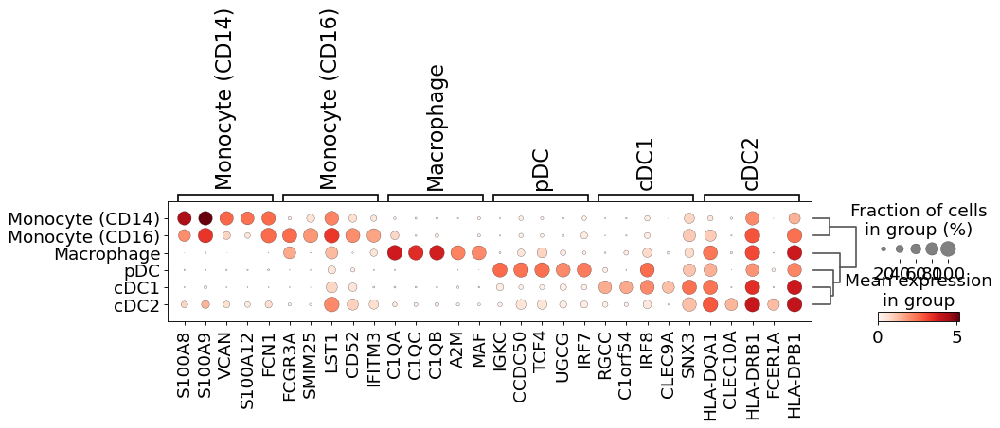

In [70]:
# sc.tl.dendrogram(adata, groupby='leiden')
sc.pl.rank_genes_groups_dotplot(adata, groupby='Myelo_cluster', n_genes=5, save='Myelo.pdf')

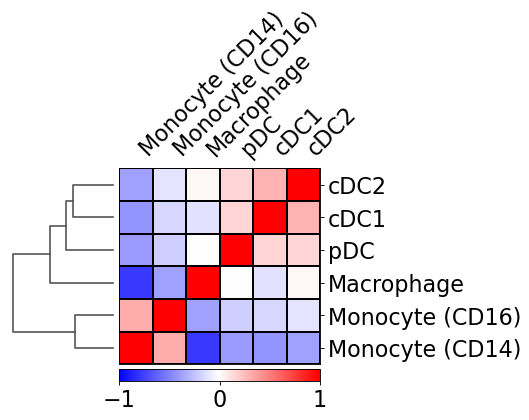

In [71]:
ax = sc.pl.correlation_matrix(adata, 'Myelo_cluster', figsize=(5,3.5))

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])


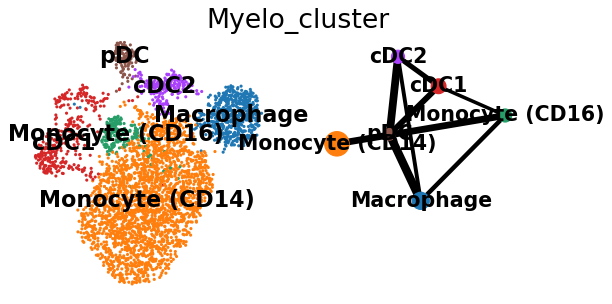

In [72]:
sc.tl.paga(adata, groups='Myelo_cluster')
sc.pl.paga_compare(adata, threshold=0.4, basis='umap')

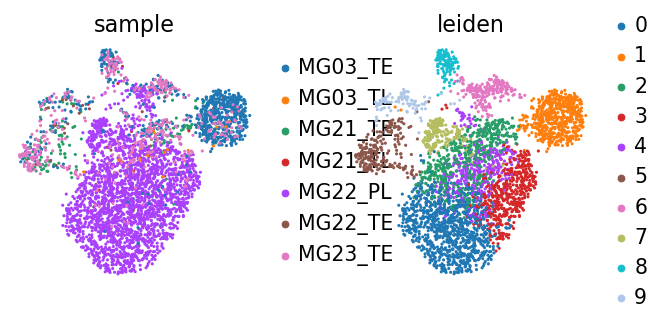

In [73]:
sc.pl.umap(adata, 
           color=['sample', 'leiden'], 
           save=False)

<AxesSubplot:xlabel='Myelo_cluster', ylabel='site'>

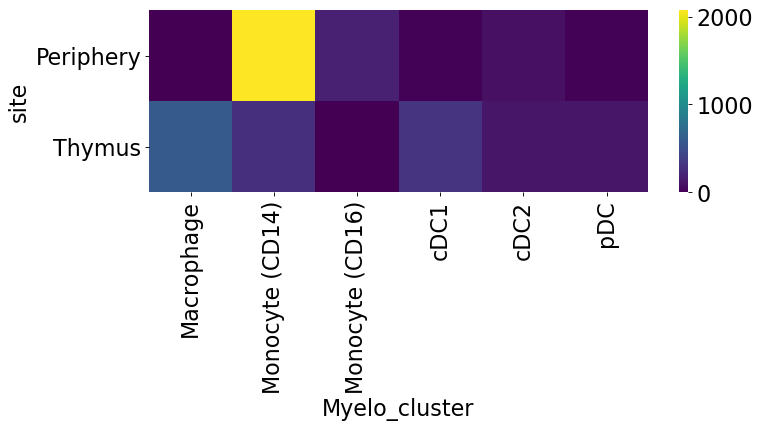

In [74]:
plt.figure(figsize=(10,3))
sns.heatmap(pd.crosstab(adata.obs['site'], adata.obs['Myelo_cluster']), cmap='viridis')

<AxesSubplot:xlabel='Myelo_cluster', ylabel='site'>

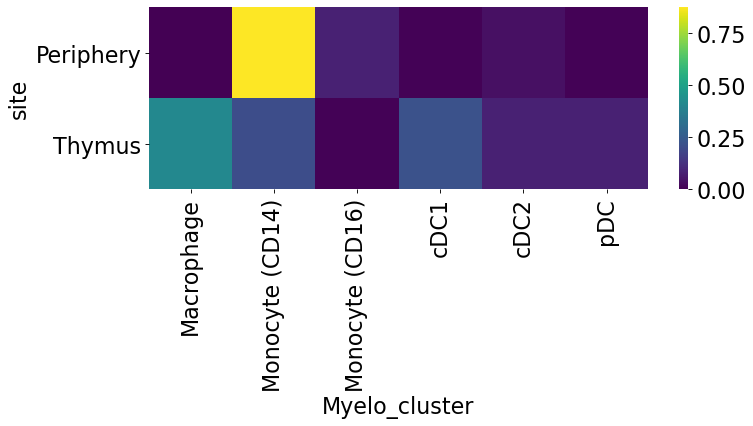

In [75]:
df_cross = pd.crosstab(adata.obs['site'], adata.obs['Myelo_cluster'])
df_cross = (df_cross.T / df_cross.sum(axis=1)).T

plt.figure(figsize=(10,3))
sns.heatmap(df_cross, cmap='viridis')

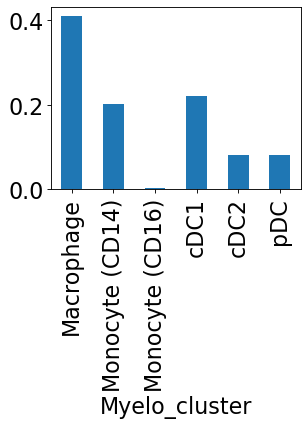

In [76]:
plt.figure(figsize=(4,3))
df_cross.loc['Thymus'].plot.bar()
plt.grid(False)

In [77]:
d = adata.obs[adata.obs['site'] == 'Thymus']
d['individual'] = d['individual'].str.split('_').str.get(0)
d = pd.crosstab(d['individual'], d['Myelo_cluster'])
d = d.T / d.sum(axis=1)

/home/yyasumizu/anaconda3/envs/scanpy1.7.2/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


<AxesSubplot:xlabel='individual', ylabel='Myelo_cluster'>

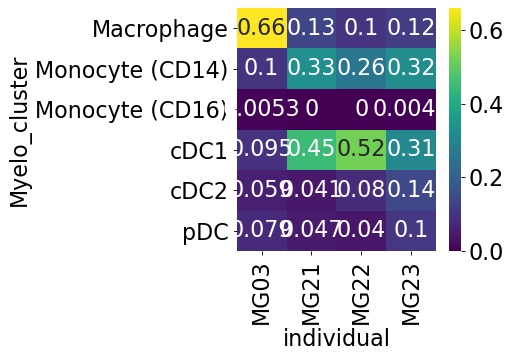

In [78]:
sns.heatmap(d, cmap='viridis', annot=True)

In [79]:
adata.obs['Myelo_cluster'].unique()

['Monocyte (CD14)', 'cDC1', 'Macrophage', 'cDC2', 'pDC', 'Monocyte (CD16)']
Categories (6, object): ['Monocyte (CD14)', 'cDC1', 'Macrophage', 'cDC2', 'pDC', 'Monocyte (CD16)']

In [91]:
list_label = ['Monocyte (CD14)', 'Monocyte (CD16)', 'Macrophage', 'cDC1', 'cDC2', 'pDC']

In [103]:
import pymc3 as pm
import arviz as az

print(f"Running on PyMC3 v{pm.__version__}")

adata.obs.individual = adata.obs.individual.str.split('_').str.get(0)
donors = adata.obs.individual.unique()
print(donors)

x_t = []
x_b = []
n_t = []
n_b = []
for lab in list_label:
    _x_t = []
    _x_b = []
    _n_t = []
    _n_b = []
    for d in donors:
        try:
            _x_t.append(adata[(adata.obs['Myelo_cluster'] == lab) & (adata.obs['site'] == 'Thymus')
                            ].obs['individual'].value_counts()[d])
        except:
            _x_t.append(0)
            
        try:
            _x_b.append(adata[(adata.obs['Myelo_cluster'] == lab) & (adata.obs['site'] == 'Periphery')
                            ].obs['individual'].value_counts()[d])
        except:
            _x_b.append(0)
            
        try:
            _n_t.append(adata[adata.obs['site'] == 'Thymus'].obs['individual'].value_counts()[d])
        except:
            _n_t.append(0)
            
        try:
            _n_b.append(adata[adata.obs['site'] == 'Periphery'].obs['individual'].value_counts()[d])
        except:
            _n_b.append(0)
    x_t.append(_x_t)
    x_b.append(_x_b)
    n_t.append(_n_t)
    n_b.append(_n_b)

x_t = np.array(x_t).T
x_b = np.array(x_b).T
n_t = np.array(n_t).T
n_b = np.array(n_b).T

Running on PyMC3 v3.11.2
['MG21' 'MG22' 'MG03' 'MG23']


In [104]:
x_t

array([[ 63,   0,  26,  87,   8,   9],
       [ 13,   0,   5,  26,   4,   2],
       [ 78,   4, 502,  72,  45,  60],
       [133,   2,  49, 129,  59,  43]])

In [105]:
n_t

array([[193, 193, 193, 193, 193, 193],
       [ 50,  50,  50,  50,  50,  50],
       [761, 761, 761, 761, 761, 761],
       [415, 415, 415, 415, 415, 415]])

In [106]:
with pm.Model() as model:
    p_thymus = pm.Uniform("p_thymus", lower=0.0, upper=1.0, shape=len(list_label))
    p_blood = pm.Uniform("p_blood", lower=0.0, upper=1.0, shape=len(list_label))
    x_thymus = pm.Binomial("x_thymus", p=p_thymus, 
                           observed=x_t, 
                           n=n_t, shape=len(list_label))
    x_blood= pm.Binomial("x_blood", p=p_blood, observed=x_b, 
                         n=n_b, shape=len(list_label))
    
    p = pm.Deterministic("p", p_thymus - p_blood)

In [107]:
model

In [108]:
with model:
    trace = pm.sample(25000, chains=4)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [p_blood, p_thymus]


Sampling 4 chains for 1_000 tune and 25_000 draw iterations (4_000 + 100_000 draws total) took 30 seconds.


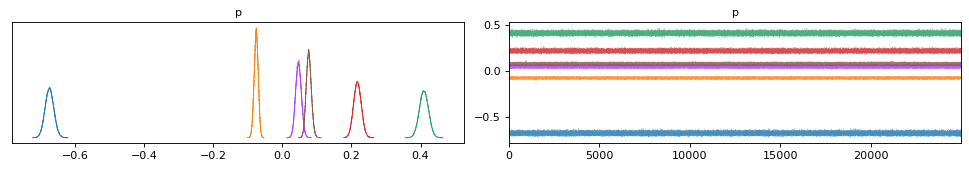

In [109]:
pm.traceplot(trace, var_names=["p"]);

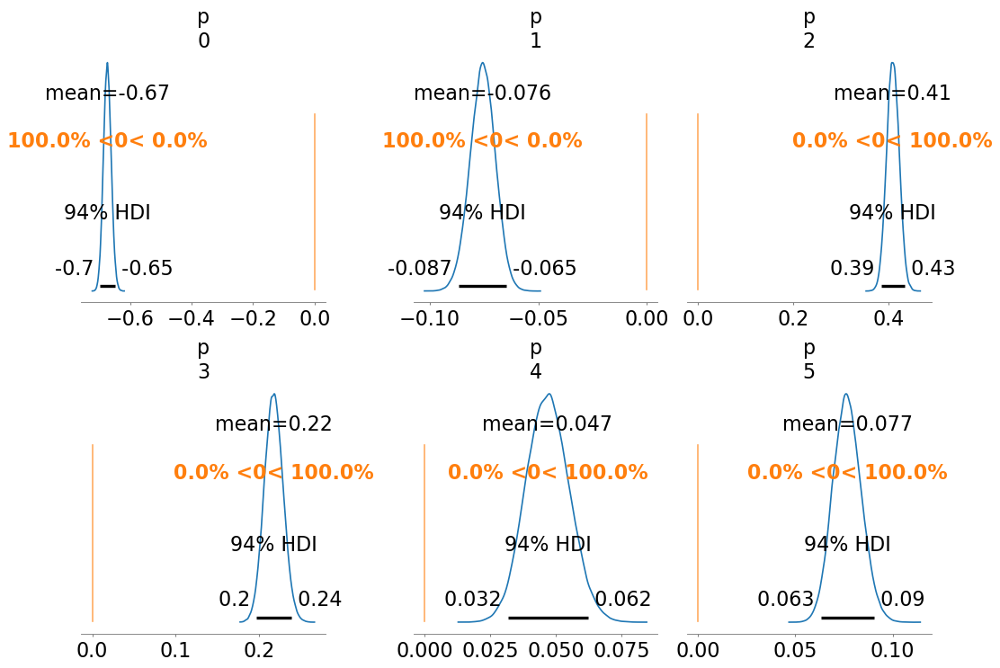

In [110]:
pm.plot_posterior(
    trace,
    var_names=["p"],
    ref_val = 0
);

In [111]:
pm.summary(trace)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
p_thymus[0],0.203,0.011,0.183,0.223,0.0,0.0,128270.0,75126.0,1.0
p_thymus[1],0.005,0.002,0.002,0.008,0.0,0.0,125019.0,67473.0,1.0
p_thymus[2],0.410,0.013,0.386,0.435,0.0,0.0,135078.0,74090.0,1.0
p_thymus[3],0.222,0.011,0.201,0.243,0.0,0.0,134870.0,77687.0,1.0
p_thymus[4],0.082,0.007,0.069,0.096,0.0,0.0,135181.0,76647.0,1.0
p_thymus[5],0.081,0.007,0.068,0.095,0.0,0.0,131373.0,77248.0,1.0
p_blood[0],0.877,0.007,0.864,0.889,0.0,0.0,132595.0,76934.0,1.0
p_blood[1],0.081,0.006,0.070,0.091,0.0,0.0,127123.0,73668.0,1.0
p_blood[2],0.000,0.000,0.000,0.001,0.0,0.0,86006.0,50613.0,1.0
p_blood[3],0.004,0.001,0.002,0.007,0.0,0.0,128437.0,71335.0,1.0


array([<AxesSubplot:title={'center':'94.0% HDI'}>], dtype=object)

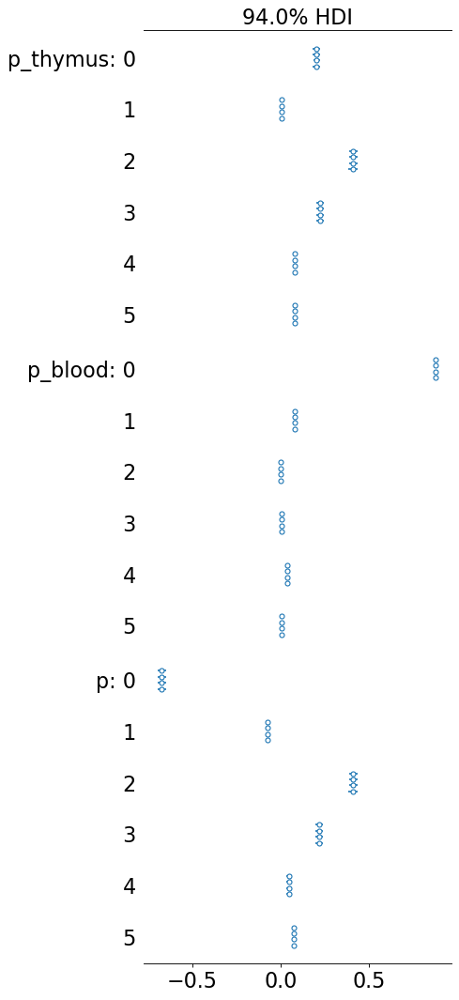

In [112]:
pm.forestplot(trace)

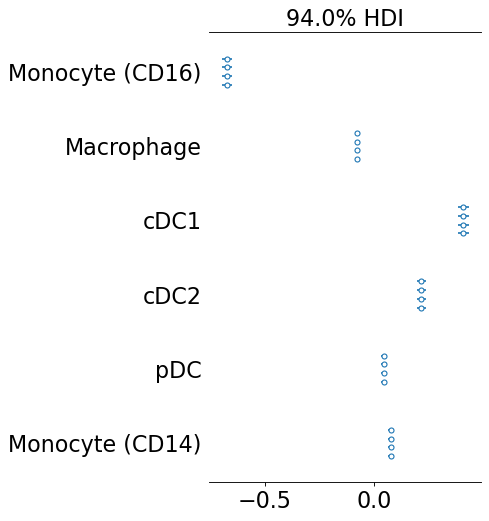

In [113]:
ax = az.plot_forest(trace, var_names=["p"])
ax[0].set_yticklabels([list_label[-i] for i in range(len(list_label))]);

In [114]:
p_thymus = []
p_blood = []

for i in range(len(list_label)):
    p_thymus.append((trace['p'][:,i] < 0).sum() / trace['p'].shape[0])
    p_blood.append((trace['p'][:,i] > 0).sum() / trace['p'].shape[0])
    
df_stats = pd.DataFrame([p_thymus, p_blood], index=['Thymus', 'Peripheral'], columns=list_label).T
df_stats

,Thymus,Peripheral
Monocyte (CD14),1.0,0.0
Monocyte (CD16),1.0,0.0
Macrophage,0.0,1.0
cDC1,0.0,1.0
cDC2,0.0,1.0
pDC,0.0,1.0


In [115]:
df_summary = pm.summary(trace, hdi_prob=0.98)
df_summary

,mean,sd,hdi_1%,hdi_99%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
p_thymus[0],0.203,0.011,0.178,0.227,0.0,0.0,128270.0,75126.0,1.0
p_thymus[1],0.005,0.002,0.001,0.010,0.0,0.0,125019.0,67473.0,1.0
p_thymus[2],0.410,0.013,0.380,0.440,0.0,0.0,135078.0,74090.0,1.0
p_thymus[3],0.222,0.011,0.197,0.248,0.0,0.0,134870.0,77687.0,1.0
p_thymus[4],0.082,0.007,0.066,0.100,0.0,0.0,135181.0,76647.0,1.0
p_thymus[5],0.081,0.007,0.064,0.098,0.0,0.0,131373.0,77248.0,1.0
p_blood[0],0.877,0.007,0.861,0.892,0.0,0.0,132595.0,76934.0,1.0
p_blood[1],0.081,0.006,0.068,0.094,0.0,0.0,127123.0,73668.0,1.0
p_blood[2],0.000,0.000,0.000,0.002,0.0,0.0,86006.0,50613.0,1.0
p_blood[3],0.004,0.001,0.002,0.008,0.0,0.0,128437.0,71335.0,1.0


In [116]:
df_summary_thymus = df_summary.loc[[x for x in df_summary.index if 'p_thymus' in x]]
df_summary_thymus.index = list_label

df_summary_blood = df_summary.loc[[x for x in df_summary.index if 'p_blood' in x]]
df_summary_blood.index = list_label

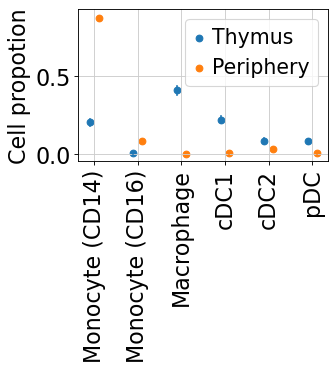

In [117]:
plt.figure(figsize=(4,2.5))
plt.scatter(np.array(range(len(list_label)))-0.1, df_summary_thymus['mean'], c='tab:blue', label='Thymus')
plt.scatter(np.array(range(len(list_label)))+0.1, df_summary_blood['mean'], c='tab:orange', label='Periphery')

for i,lab in enumerate(list_label):
    plt.plot([i-0.1, i-0.1],[df_summary_thymus.loc[lab,'hdi_1%'],df_summary_thymus.loc[lab,'hdi_99%']], c='tab:blue')
    plt.plot([i+0.1, i+0.1],[df_summary_blood.loc[lab,'hdi_1%'],df_summary_blood.loc[lab,'hdi_99%']], c='tab:orange')
    
plt.xticks(ticks=range(len(list_label)), labels=list_label, rotation=90)
plt.ylabel('Cell propotion')
plt.legend()
plt.grid(None)
plt.savefig(str(sc.settings.figdir) + '/forest_hdi1%99%.pdf', bbox_inches='tight')

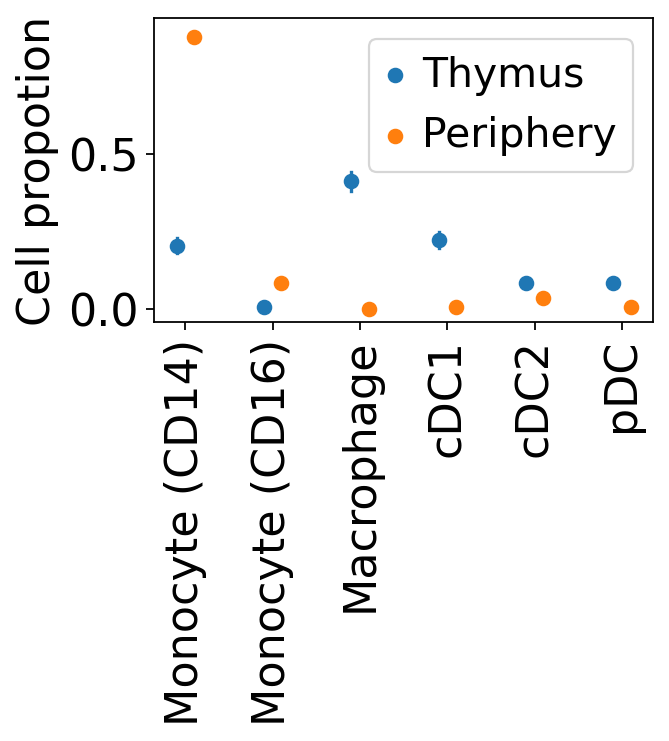

In [24]:
plt.figure(figsize=(4,2.5))
plt.scatter(np.array(range(len(list_label)))-0.1, df_summary_thymus['mean'], c='tab:blue', label='Thymus')
plt.scatter(np.array(range(len(list_label)))+0.1, df_summary_blood['mean'], c='tab:orange', label='Periphery')

for i,lab in enumerate(list_label):
    plt.plot([i-0.1, i-0.1],[df_summary_thymus.loc[lab,'hdi_1%'],df_summary_thymus.loc[lab,'hdi_99%']], c='tab:blue')
    plt.plot([i+0.1, i+0.1],[df_summary_blood.loc[lab,'hdi_1%'],df_summary_blood.loc[lab,'hdi_99%']], c='tab:orange')
    
plt.xticks(ticks=range(len(list_label)), labels=list_label, rotation=90)
plt.ylabel('Cell propotion')
plt.legend()
plt.grid(None)
plt.savefig(str(sc.settings.figdir) + '/forest_hdi1%99%.pdf', bbox_inches='tight')

In [4]:
sc.tl.embedding_density(adata, groupby='site')

computing density on 'umap'
--> added
    'umap_density_site', densities (adata.obs)
    'umap_density_site_params', parameter (adata.uns)


/home/yyasumizu/anaconda3/envs/scanpy1.7.2/lib/python3.7/site-packages/scanpy/plotting/_tools/__init__.py:1186: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("YlOrRd").copy()
  color_map.set_over('black')
/home/yyasumizu/anaconda3/envs/scanpy1.7.2/lib/python3.7/site-packages/scanpy/plotting/_tools/__init__.py:1187: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("YlOrRd").copy()
  color_map.set_under('lightgray')
/home/yyasumizu/anaconda3/envs/scanpy1.7.2/lib/python3.7/site-packages/scanpy/plotting/_too

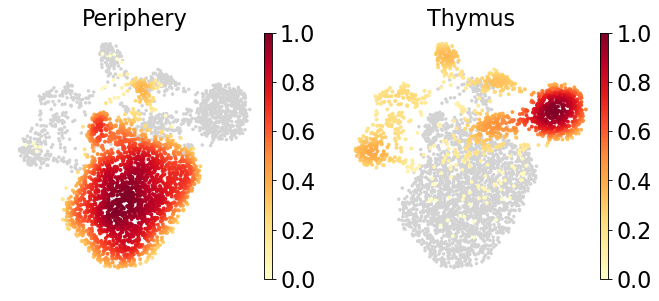

In [5]:
sc.pl.embedding_density(adata, groupby='site', bg_dotsize=40, fg_dotsize=50, save='site')

In [81]:
adata.write(results_file_myeloid)

In [87]:
adata = sc.read(results_file_myeloid)

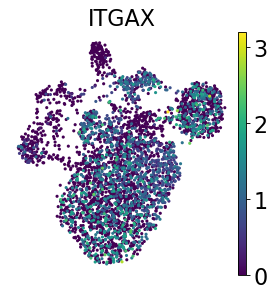

In [89]:
sc.pl.umap(adata, color=['ITGAX'], save='itgax')

## summarize clusters

In [82]:
adata_myelo_all = sc.read(results_file_myeloid_all)
adata_myelo = sc.read(results_file_myeloid)

In [83]:
df_cluster = adata_myelo_all.obs[['Myeloid_cluster']]
df_cluster.columns = ['minor_cluster']
df_cluster['minor_cluster'] = df_cluster['minor_cluster'].astype(str)
df_cluster.head()

/home/yyasumizu/anaconda3/envs/scanpy1.7.2/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,minor_cluster
AACACACTCTACCAGA,Myeloid cell
AACCCAACACGGATCC,Myeloid cell
AAGTACCCATATACCG,Myeloid cell
AATGACCAGGCCCAAA,Myeloid cell
AATGACCGTGACAGGT,Doublet


In [84]:
adata_myelo

AnnData object with n_obs × n_vars = 3785 × 2725
    obs: 'sample', 'sample_type', 'site', 'fraction', 'n_genes', 'individual', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Myelo_cluster'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'Myelo_cluster_colors', 'Myelo_cluster_sizes', 'dendrogram_Myelo_cluster', 'dendrogram_leiden', 'leiden', 'leiden_colors', 'leiden_sizes', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'sample_colors', 'site_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [85]:
df_cluster_myelo = adata_myelo.obs[['Myelo_cluster']]
df_cluster_myelo.columns = ['minor_cluster']
df_cluster_myelo['minor_cluster'] = df_cluster_myelo['minor_cluster'].astype(str)
df_cluster_myelo.head()

/home/yyasumizu/anaconda3/envs/scanpy1.7.2/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,minor_cluster
AACACACTCTACCAGA,Monocyte (CD14)
AACCCAACACGGATCC,Monocyte (CD14)
AAGTACCCATATACCG,cDC1
AATGACCAGGCCCAAA,Monocyte (CD14)
ACAACCAGTAAGATAC,cDC1


In [86]:
df_cluster.loc[df_cluster_myelo.index, 'minor_cluster'] = list(df_cluster_myelo['minor_cluster'])
adata_myelo_all.obs['minor_cluster'] = list(df_cluster['minor_cluster'])
adata_myelo_all = adata_myelo_all[adata_myelo_all.obs['minor_cluster'] != 'Myeloid cell']

/home/yyasumizu/anaconda3/envs/scanpy1.7.2/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/home/yyasumizu/anaconda3/envs/scanpy1.7.2/lib/python3.7/site-packages/pandas/core/indexing.py:692: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


/home/yyasumizu/anaconda3/envs/scanpy1.7.2/lib/python3.7/site-packages/anndata/_core/anndata.py:1229: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'minor_cluster' as categorical


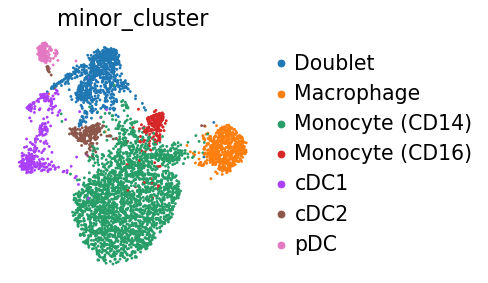

In [87]:
sc.pl.umap(adata_myelo_all, 
           color=['minor_cluster'], 
           save='minor_cluster')

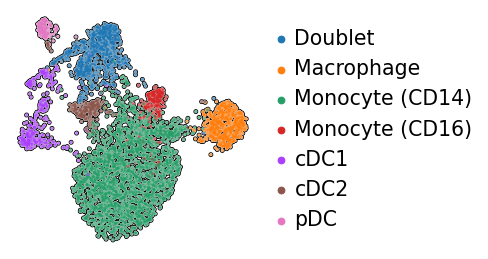

In [88]:
sc.pl.umap(adata_myelo_all, color='minor_cluster', title='', add_outline=True, 
           frameon=False, save='minor_cluster_out.pdf')

In [89]:
adata_myelo_all.write(results_file_myeloid_minor_cluster)

In [90]:
adata = sc.read(results_file_myeloid_minor_cluster)
adata_raw = sc.read(results_raw_file_master)

adata_cg = adata_raw[adata.obs.index].copy()
adata_cg.obs = adata.obs
adata_cg.obsm = adata.obsm
adata_cg.uns = adata.uns

sc.pp.normalize_per_cell(adata_cg, counts_per_cell_after=1e4)
sc.pp.log1p(adata_cg)

adata_cg.write(results_file_cg_myeloid_minor_cluster)

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


## Velocyto

In [62]:
import scvelo as scv
mpl.rcParams['axes.grid'] = False

In [63]:
adata = sc.read('./data/velocyto.210430.merged.loom')
adata.var_names_make_unique()
adata.obs.index = [x.split(':')[1][:-1] for x in adata.obs.index]
adata.obs_names_make_unique()

Only considering the two last: ['.merged', '.loom'].
Only considering the two last: ['.merged', '.loom'].
--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [64]:
mdata = sc.read(results_file_myeloid)

In [65]:
# mdata = mdata[mdata.obs['site'] == 'Thymus']

In [66]:
list_overlap_cells = list(set(adata.obs.index) & set(mdata.obs.index))

In [67]:
adata = adata[list_overlap_cells,:]
mdata = mdata[list_overlap_cells,:]
adata.obs['Myelo_cluster'] = mdata.obs['Myelo_cluster']
adata.uns['Myelo_cluster_colors'] = mdata.uns['Myelo_cluster_colors']
adata.obsm['X_umap'] = mdata.obsm['X_umap']

Trying to set attribute `.obs` of view, copying.


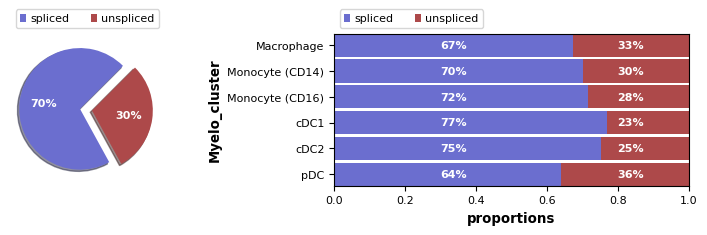

In [68]:
scv.pl.proportions(adata, groupby="Myelo_cluster")
# plt.grid(False)

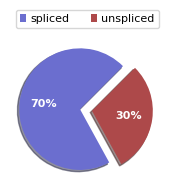

In [69]:
scv.pl.proportions(adata, groupby="sample")
# plt.grid(False)

In [70]:
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

Filtered out 28738 genes that are detected 20 counts (shared).
Normalized count data: X, spliced, unspliced.


computing PCA
    on highly variable genes
    with n_comps=30


Extracted 2000 highly variable genes.
Logarithmized X.


    finished (0:00:01)


computing neighbors
    finished (0:00:00) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [71]:
scv.tl.recover_dynamics(adata)

recovering dynamics (using 1/16 cores)


  0%|          | 0/722 [00:00<?, ?gene/s]

    finished (0:03:46) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


In [72]:
scv.tl.velocity(adata) #, mode='stochastic', filter_genes=True)
scv.tl.velocity_graph(adata) #, n_recurse_neighbors=2)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph
    finished (0:00:06) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [73]:
scv.tl.velocity_embedding(adata, basis='umap')
# scv.tl.velocity_embedding(adata, basis='draw_graph_fr')

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


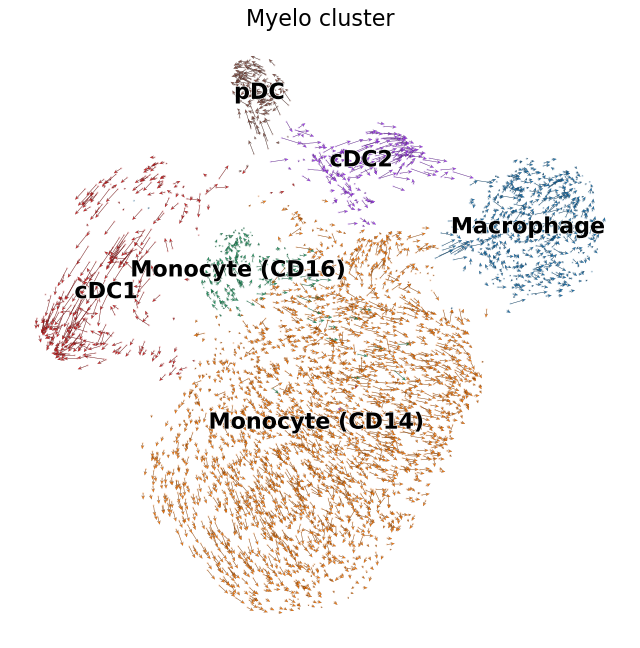

In [74]:
scv.pl.velocity_embedding(adata, basis='umap', color='Myelo_cluster', 
                          legend_loc='on data', scale=.5, figsize=(10,10))
# scv.pl.velocity_embedding(adata, basis='draw_graph_fr', color='louvain', scale=3, legend_loc='on data')

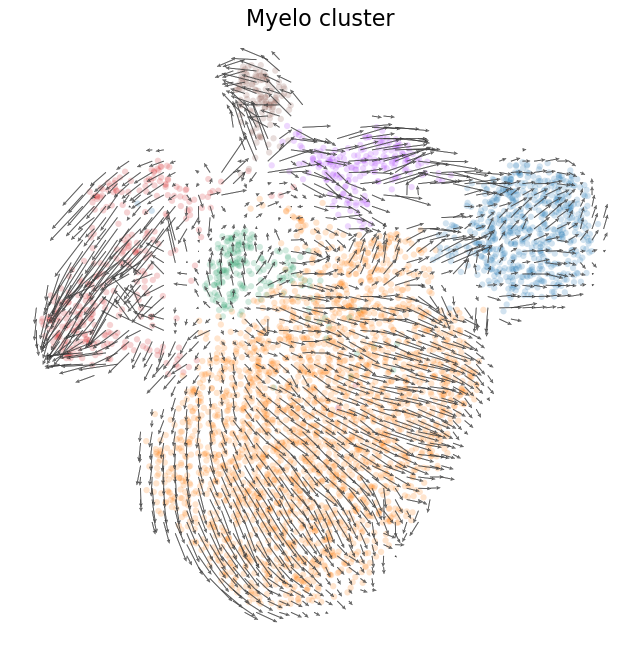

In [75]:
scv.pl.velocity_embedding_grid(adata, basis='umap', color='Myelo_cluster',
                               density=1, scale=.3, figsize=(10,10))
# scv.pl.velocity_embedding_grid(adata, basis='draw_graph_fr', color='louvain', density=1, scale=2)

figure cannot be saved as pdf, using png instead.
saving figure to file ./figures/scvelo_stream.png


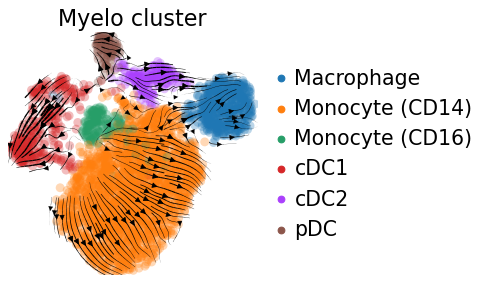

In [86]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color='Myelo_cluster', 
                                 legend_loc='right mergin', save='stream')

computing terminal states
    identified 2 regions of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


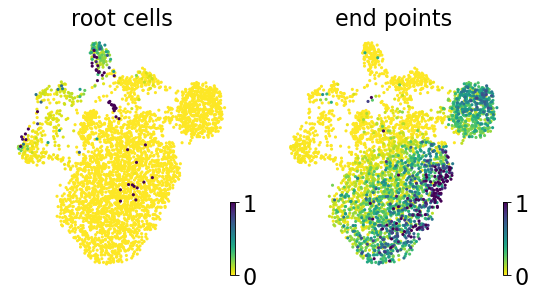

In [77]:
scv.tl.terminal_states(adata)
scv.pl.scatter(adata, color=['root_cells', 'end_points'])

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


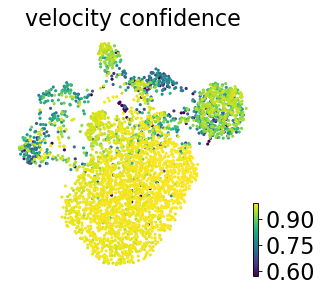

In [78]:
scv.tl.velocity_confidence(adata)
scv.pl.scatter(adata, color='velocity_confidence', perc=[2,98])

In [79]:
scv.tl.rank_velocity_genes(adata, groupby='Myelo_cluster', min_corr=.3)

df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

ranking velocity genes
    finished (0:00:01) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


,Macrophage,Monocyte (CD14),Monocyte (CD16),cDC1,cDC2,pDC
0,FRMD4A,ARHGAP26,MTSS1,ZNF366,ADAM28,CUX2
1,SPRED1,DPYD,ITGA4,WDFY4,BCL2,NIBAN3
2,MERTK,FNDC3B,GPR155,DST,SLC38A1,LHFPL2
3,DOCK4,SORL1,CTSS,RUBCNL,GPRIN3,ADAM19
4,KCNMA1,NAMPT,CSF1R,IL18R1,IL18R1,CRIM1


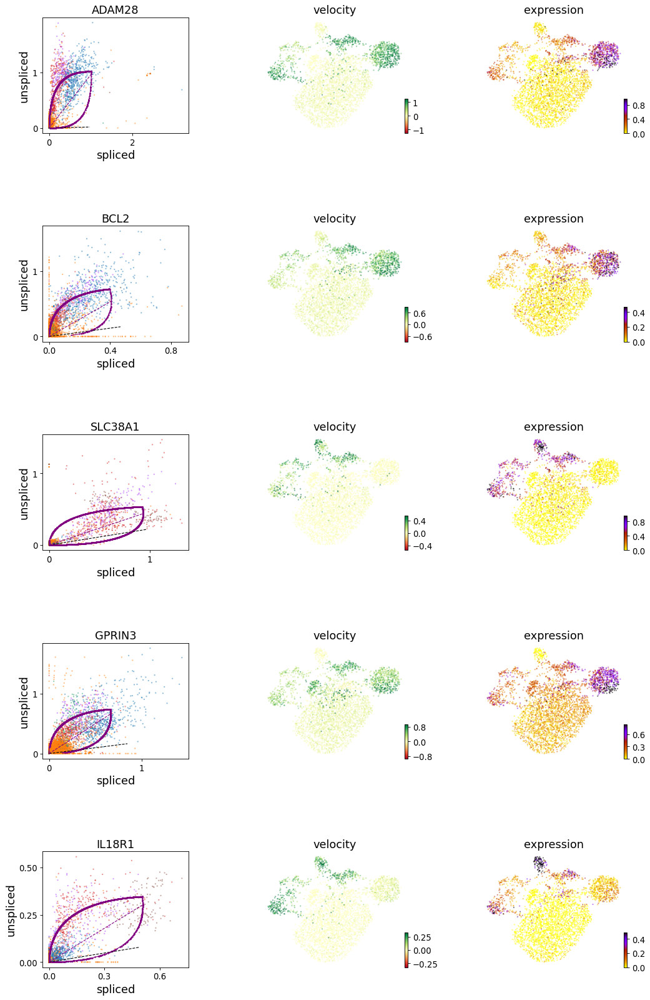

In [80]:
scv.pl.velocity(adata, var_names=df.head(5)['cDC2'],
                color='Myelo_cluster', basis='umap', figsize=(10,10))

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


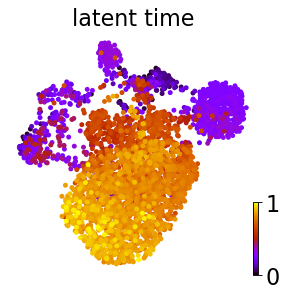

In [81]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80)

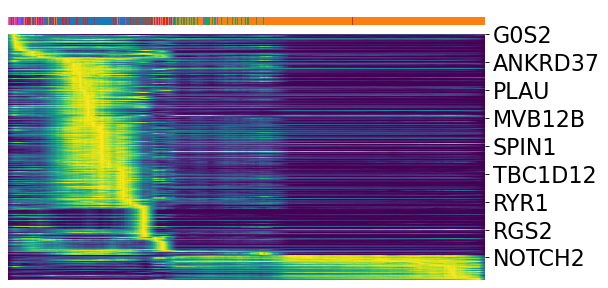

In [82]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index[:300]
scv.pl.heatmap(adata, var_names=top_genes, sortby='latent_time', 
               col_color='Myelo_cluster', 
               n_convolve=100)